# 03 — Classical Segmentation Techniques

Third notebook in the pipeline (see `01_data_preparation.ipynb` for the full layout). Loads the
preprocessed 512x512 images/masks cached by `02_eda_and_preprocessing.ipynb` — no re-downloading or
re-preprocessing here.

**Step 4** implements each classical segmentation technique as its own function, run on the same
4 demo images (2 Montgomery + 2 Shenzhen) so they're directly comparable. **Step 7**'s math writeup
for each technique is inline, right where that technique is introduced, rather than in a separate
section — it reads better paired with the code than collected at the end.

**A note on expectations.** Chest X-ray lung segmentation is a known hard case for *purely*
intensity-based classical methods: the air outside a patient's body is exposed almost the same way
as air inside the lungs, so both come out dark. A textbook thresholding/clustering/region-growing
method has no anatomical prior to tell them apart, and per the assignment constraints, we're not
allowed to bolt one on (no "assume lungs are in the left/right thirds" -style shortcuts) — these
techniques should stay as their standard textbook implementations. So several of them are expected
to leak into the image background here; that's a real, honest finding to carry into Step 6's
quantitative comparison, not a bug to hide.

One preprocessing detail specific to this notebook: Step 3's letterbox padding is exact black
(pixel value 0) and would trivially get picked up as "dark foreground" by every intensity-based
method below. We mask it out with a `valid_region_mask` computed from each image's known padding —
this only removes synthetic canvas we introduced ourselves, not an anatomical assumption.

In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

from skimage.segmentation import felzenszwalb, flood
from skimage.feature import peak_local_max
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

DATA_DIR = Path("../data")
PROC_IMG_DIR = DATA_DIR / "processed" / "images"
PROC_MASK_DIR = DATA_DIR / "processed" / "masks"
TARGET_SIZE = 512

assert (DATA_DIR / "manifest.csv").exists(), "Run 01_data_preparation.ipynb first to generate data/manifest.csv"
assert PROC_IMG_DIR.exists(), "Run 02_eda_and_preprocessing.ipynb first to generate data/processed/"

manifest = pd.read_csv(DATA_DIR / "manifest.csv").set_index("id", drop=False)

def load_processed(id_):
    img = np.array(Image.open(PROC_IMG_DIR / f"{id_}.png"))
    mask = np.array(Image.open(PROC_MASK_DIR / f"{id_}.png"))
    return img, mask

def compute_letterbox(orig_w, orig_h, target=TARGET_SIZE):
    # mirrors notebook 02's letterbox transform -- needed here to know which
    # border pixels are synthetic padding vs. real image content
    scale = target / max(orig_w, orig_h)
    new_w, new_h = int(round(orig_w * scale)), int(round(orig_h * scale))
    pad_w, pad_h = target - new_w, target - new_h
    top, bottom = pad_h // 2, pad_h - pad_h // 2
    left, right = pad_w // 2, pad_w - pad_w // 2
    return top, bottom, left, right

def valid_region_mask(id_):
    with Image.open(manifest.loc[id_, "image_path"]) as im:
        w, h = im.size
    top, bottom, left, right = compute_letterbox(w, h)
    vmask = np.zeros((TARGET_SIZE, TARGET_SIZE), dtype=bool)
    vmask[top:TARGET_SIZE - bottom, left:TARGET_SIZE - right] = True
    return vmask

train_df = manifest[manifest.split == "train"]
DEMO_IDS = pd.concat([
    train_df[train_df.source == "Montgomery"].sample(2, random_state=7),
    train_df[train_df.source == "Shenzhen"].sample(2, random_state=7),
])["id"].tolist()
print("Demo images used throughout Step 4:", DEMO_IDS)

Demo images used throughout Step 4: ['MCUCXR_0040_0', 'MCUCXR_0294_1', 'CHNCXR_0633_1', 'CHNCXR_0132_0']


### Shared visualization helper

Used by every technique below so results are visually comparable: input | ground truth overlay |
prediction overlay, one row per demo image.

In [2]:
def show_method_grid(method_fn, method_name, ids=None):
    ids = ids or DEMO_IDS
    fig, axes = plt.subplots(len(ids), 3, figsize=(9, 3 * len(ids)))
    if len(ids) == 1:
        axes = axes[None, :]
    for row, id_ in zip(axes, ids):
        img, gt = load_processed(id_)
        vmask = valid_region_mask(id_)
        pred = method_fn(img, vmask)
        row[0].imshow(img, cmap="gray"); row[0].set_title(f"{id_} input"); row[0].axis("off")
        row[1].imshow(img, cmap="gray"); row[1].imshow(gt, cmap="Greens", alpha=0.45); row[1].set_title("ground truth"); row[1].axis("off")
        row[2].imshow(img, cmap="gray"); row[2].imshow(pred.astype(np.uint8) * 255, cmap="Reds", alpha=0.45); row[2].set_title(method_name); row[2].axis("off")
    fig.suptitle(method_name)
    fig.tight_layout()
    plt.show()

## 4.1 Global thresholding — Otsu's method

Otsu's threshold $t^*$ maximizes the **between-class variance** over all possible thresholds $t$:

$$\sigma_B^2(t) = \omega_0(t)\,\omega_1(t)\,[\mu_0(t) - \mu_1(t)]^2, \qquad t^* = \arg\max_t \sigma_B^2(t)$$

where $\omega_0(t), \omega_1(t)$ are the pixel-probability masses below/above $t$ and $\mu_0(t),
\mu_1(t)$ their class means. It's a global, single-threshold method — every pixel below $t^*$ is
called foreground (lung candidate, since lungs are darker than surrounding soft tissue).

**Why no tuning here:** Otsu has no hyperparameters to justify — that's the whole appeal. $t^*$ is
computed directly from each image's own histogram, automatically, with nothing picked by hand.

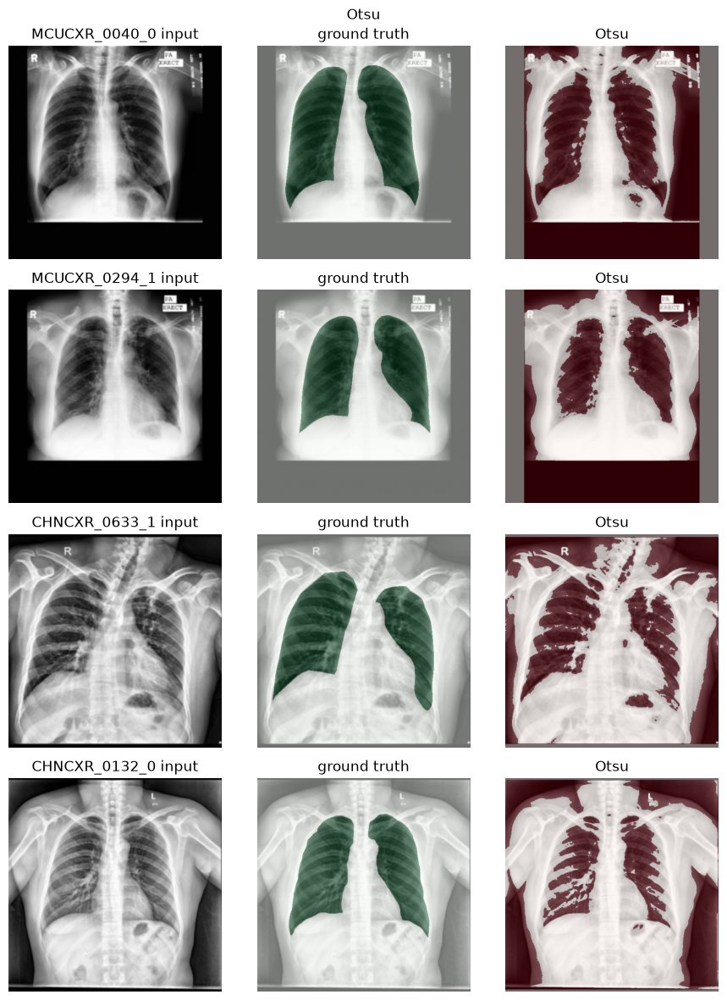

In [3]:
def segment_otsu(img, valid_mask):
    t, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return (img < t) & valid_mask

show_method_grid(segment_otsu, "Otsu")

## 4.2 Adaptive thresholding

Otsu picks one threshold for the whole image; adaptive thresholding instead computes a
**locally-varying** threshold $T(x,y)$ from a neighborhood around each pixel — here a
Gaussian-weighted mean of a $51\times51$ window minus a constant $C$:

$$T(x,y) = \text{GaussianMean}_{51\times51}(x,y) - C, \qquad \text{foreground if } I(x,y) < T(x,y)$$

This copes with the large brightness gradient across a chest X-ray (film/detector edge falloff,
exposure differences between Montgomery and Shenzhen) that a single global threshold can't.

**Why blockSize=51, C=5:** blockSize must be odd; 51px (~10% of the 512px canvas) is large enough
to span real anatomical structure — so the local mean reflects surrounding tissue, not just pixel
noise — while still being "local" enough to track the illumination gradient across the image. C=5
is a small constant bias below the local mean, standard practice so near-uniform regions aren't
flagged as foreground from noise alone. Both were picked by checking the output visually on the
demo images, not tuned against ground truth.

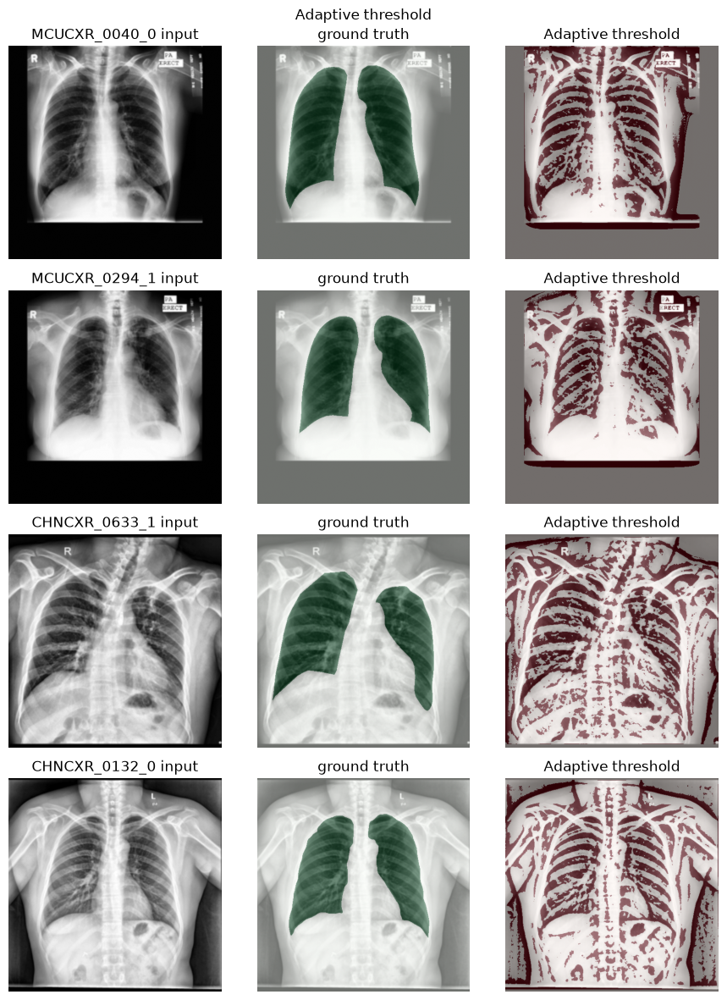

In [4]:
def segment_adaptive(img, valid_mask):
    th = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                cv2.THRESH_BINARY_INV, blockSize=51, C=5)
    return (th > 0) & valid_mask

show_method_grid(segment_adaptive, "Adaptive threshold")

## 4.3 Edge-based — Sobel gradient, Canny, contour closing

The Sobel operator estimates the image gradient via two $3\times3$ convolution kernels $G_x, G_y$;
its magnitude and direction are

$$|\nabla I| = \sqrt{G_x^2 + G_y^2}, \qquad \theta = \operatorname{atan2}(G_y, G_x)$$

Canny builds on this: non-maximum suppression thins the gradient-magnitude ridges to 1px-wide
edges (keeping only local maxima along $\theta$), then **hysteresis thresholding** with a low/high
threshold pair keeps strong edges, keeps weak edges only if connected to a strong one, and drops
the rest. Canny's output is a set of edge *fragments*, not a filled region, so we morphologically
close small gaps and fill the resulting closed contours to get a binary mask.

**Why 50/150 for the Canny thresholds, and a 7x7 kernel / 2 iterations for closing:** the low:high
ratio of 1:3 follows the range commonly recommended from the original Canny paper and OpenCV's own
tutorials (roughly 1:2 to 1:3); the absolute values were then set by visually confirming the demo
images' rib and lung boundaries come through as continuous edges without a flood of noise edges.
The 7x7 closing kernel (2 iterations) is sized to bridge the small gaps hysteresis thresholding
tends to leave along a curved boundary, without being so large it welds together edges that should
stay separate. Both were set by inspection on the demo images, not tuned against ground truth.

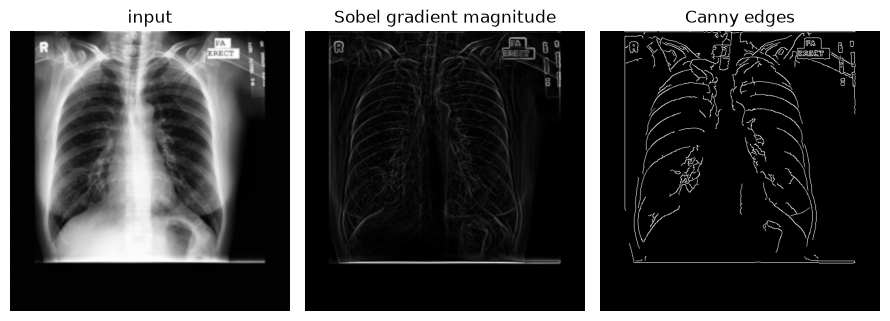

In [5]:
img_demo, _ = load_processed(DEMO_IDS[0])
gx = cv2.Sobel(img_demo, cv2.CV_64F, 1, 0, ksize=3)
gy = cv2.Sobel(img_demo, cv2.CV_64F, 0, 1, ksize=3)
grad_mag = cv2.normalize(cv2.magnitude(gx, gy), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
edges_demo = cv2.Canny(img_demo, 50, 150)

fig, axes = plt.subplots(1, 3, figsize=(9, 3.2))
for ax, im, title in zip(axes, [img_demo, grad_mag, edges_demo], ["input", "Sobel gradient magnitude", "Canny edges"]):
    ax.imshow(im, cmap="gray"); ax.set_title(title); ax.axis("off")
fig.tight_layout(); plt.show()

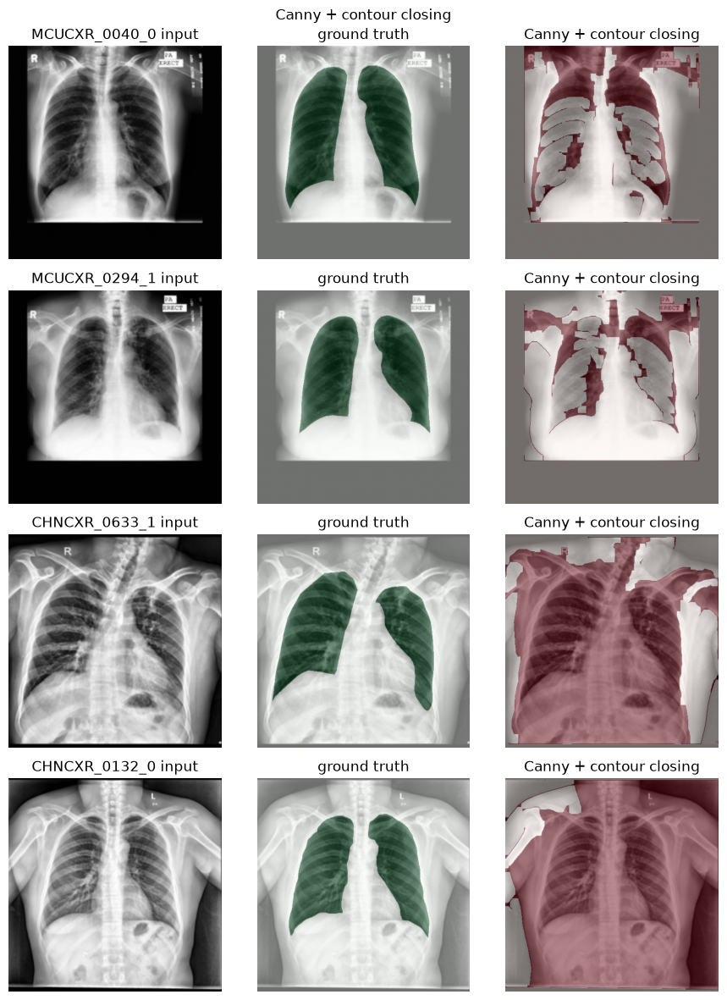

In [6]:
def segment_canny(img, valid_mask):
    edges = cv2.Canny(img, 50, 150)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, np.ones((7, 7), np.uint8), iterations=2)
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filled = np.zeros_like(img)
    cv2.drawContours(filled, contours, -1, 255, thickness=cv2.FILLED)
    return (filled > 0) & valid_mask

show_method_grid(segment_canny, "Canny + contour closing")

## 4.4 Region-based — seeded region growing

Classic region growing expands a region $R$ from a seed pixel by repeatedly absorbing neighboring
pixels that satisfy a **homogeneity predicate** — here, intensity within a fixed tolerance of the
seed's intensity:

$$p \in R \iff |I(p) - I(\text{seed})| \le \tau$$

applied iteratively over the pixel's connectivity (flood-fill). We use `skimage.segmentation.flood`
for an efficient implementation of exactly this rule, rather than a naive pixel-by-pixel Python
loop (which would be far too slow at 512x512). Seeds are chosen as the two strongest local
intensity minima found by `peak_local_max` on the (smoothed, inverted) image — a general,
data-driven heuristic for "start somewhere dark," not a hardcoded spatial rule about where lungs
are expected to be.

**Why tolerance=15, min_distance=60:** tolerance is in the same 0-255 intensity units as the image;
15 (~6% of the range) is loose enough to grow across the low-contrast interior of a lung field (see
the Step 2.2 intensity histograms — lung fields aren't perfectly flat) but tight enough to stop at
the sharper rib/soft-tissue boundary. min_distance=60px (~12% of the 512px canvas) just keeps the
two seed points from both landing in the same lung — it's a spacing constraint on the seed search,
not a location assumption about where lungs are.

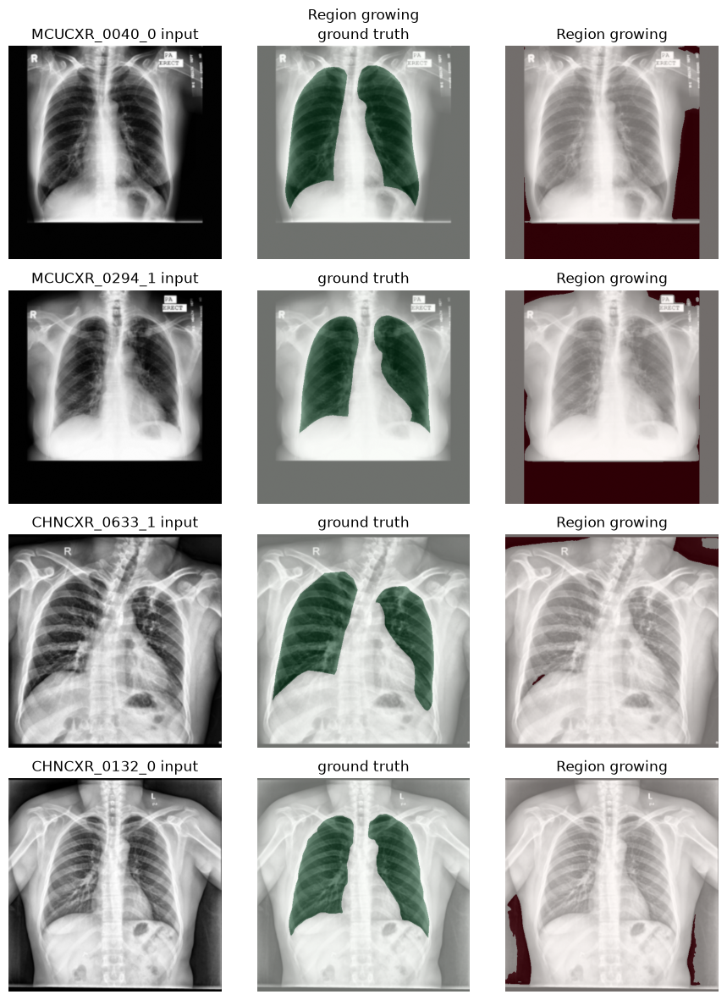

In [7]:
def segment_region_growing(img, valid_mask, tolerance=15, min_distance=60):
    smooth = cv2.GaussianBlur(img, (9, 9), 0)
    inv = 255 - smooth.astype(np.int16)
    coords = peak_local_max(inv, min_distance=min_distance, num_peaks=10,
                             labels=valid_mask.astype(np.uint8))
    pred = np.zeros_like(valid_mask, dtype=bool)
    if len(coords) == 0:
        return pred
    vals = inv[coords[:, 0], coords[:, 1]]
    seeds = coords[np.argsort(-vals)[:2]]  # 2 darkest local minima = seed points
    for y, x in seeds:
        pred |= flood(smooth, seed_point=(y, x), tolerance=tolerance)
    return pred & valid_mask

show_method_grid(segment_region_growing, "Region growing")

## 4.5 Cluster-based — K-means and Gaussian Mixture Model

Both cluster pixels by intensity (feature $x_i \in [0,1]$ per pixel) into $k=3$ groups
(air/lung, soft tissue, bone) and call the darkest-centroid cluster "foreground."

**K-means** minimizes total within-cluster squared distance to the cluster centroids $\mu_k$:

$$J = \sum_{k=1}^{K} \sum_{x_i \in C_k} \lVert x_i - \mu_k \rVert^2$$

solved by Lloyd's algorithm (alternate: assign points to nearest centroid, recompute centroids).

**Gaussian Mixture Model** instead models the intensity distribution as a mixture of $K$ Gaussians
and fits it by maximizing the data log-likelihood via Expectation-Maximization:

$$\log p(x) = \sum_{i} \log \sum_{k=1}^{K} \pi_k \, \mathcal{N}(x_i \mid \mu_k, \Sigma_k)$$

GMM gives each pixel a soft (probabilistic) cluster assignment rather than K-means' hard
nearest-centroid split, which can matter at the fuzzy boundary between lung and soft tissue.

**Why k=3:** three clusters map onto the three dominant density bands an X-ray actually has —
air/lung (dark), soft tissue (mid), bone/rib (bright). This is a standard choice for coarse
tissue-density clustering on radiographs, applied the same way to every image, not tuned per-image
or per-source.

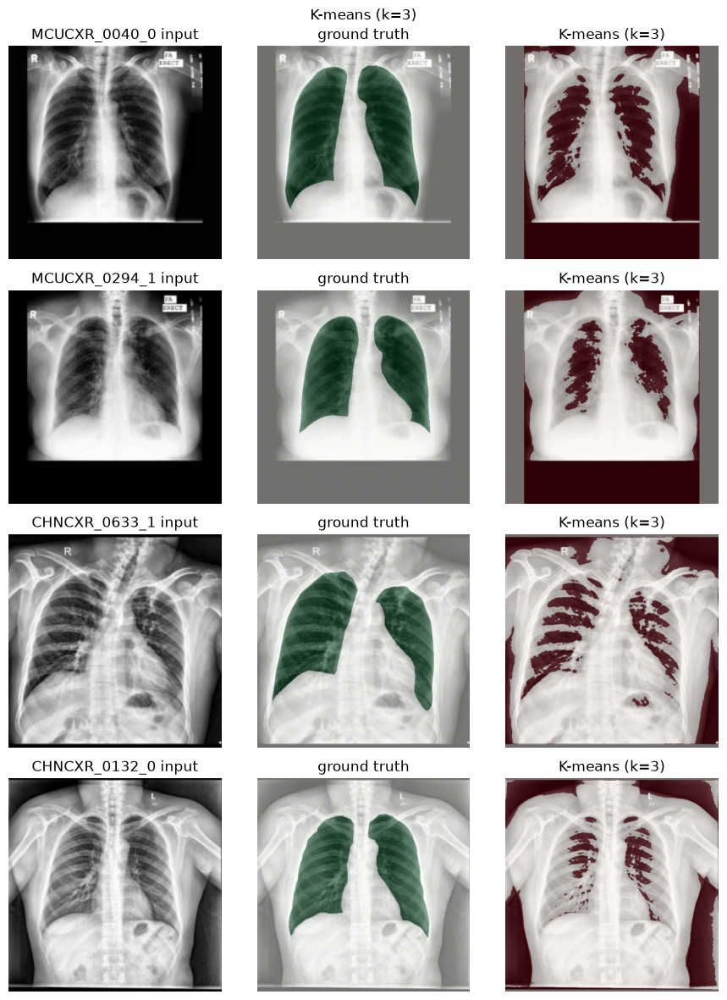

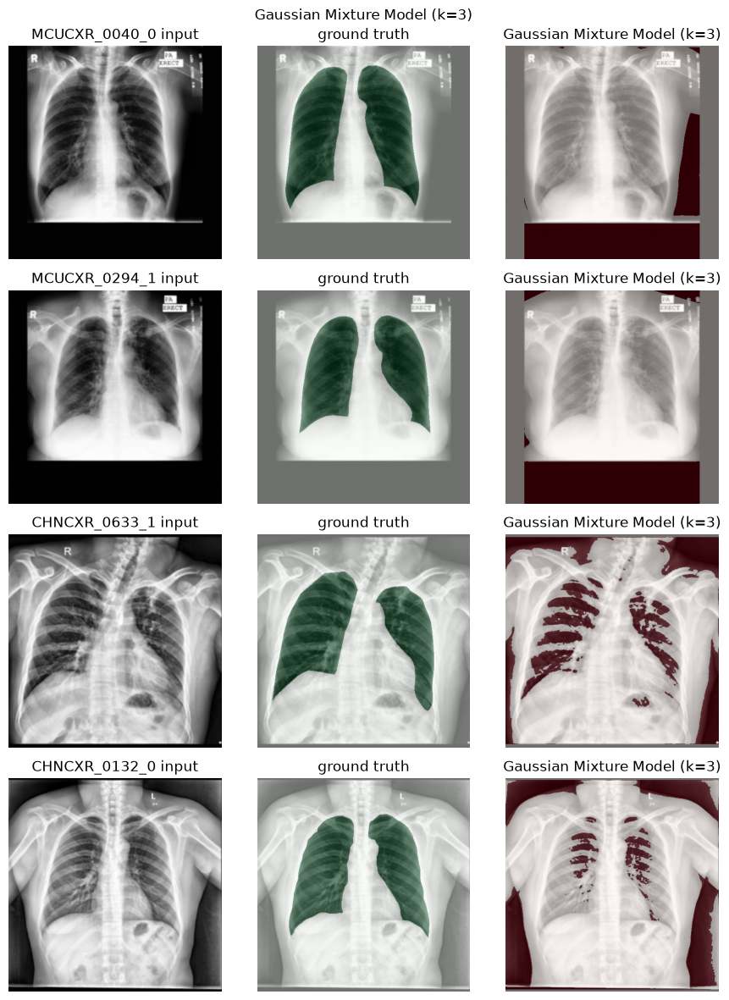

In [8]:
def _cluster_features(img, valid_mask):
    ys, xs = np.where(valid_mask)
    intens = (img[ys, xs].astype(np.float32) / 255.0).reshape(-1, 1)
    return ys, xs, intens

def segment_kmeans(img, valid_mask, k=3):
    ys, xs, feats = _cluster_features(img, valid_mask)
    km = KMeans(n_clusters=k, n_init=4, random_state=0).fit(feats)
    fg_cluster = np.argmin(km.cluster_centers_[:, 0])
    pred = np.zeros_like(valid_mask, dtype=bool)
    pred[ys[km.labels_ == fg_cluster], xs[km.labels_ == fg_cluster]] = True
    return pred

def segment_gmm(img, valid_mask, k=3):
    ys, xs, feats = _cluster_features(img, valid_mask)
    gmm = GaussianMixture(n_components=k, random_state=0).fit(feats)
    labels = gmm.predict(feats)
    fg_cluster = np.argmin(gmm.means_[:, 0])
    pred = np.zeros_like(valid_mask, dtype=bool)
    pred[ys[labels == fg_cluster], xs[labels == fg_cluster]] = True
    return pred

show_method_grid(segment_kmeans, "K-means (k=3)")
show_method_grid(segment_gmm, "Gaussian Mixture Model (k=3)")

## 4.6 Watershed — distance transform + marker-controlled

Treats an image as a topographic surface and "floods" it from marker points outward, building a
dividing ridge ("watershed line") wherever two floods meet. Rather than flood the raw image (which
over-segments badly on noisy gradients), we flood the **distance transform** of a binary
foreground candidate — for each foreground pixel $p$, $D(p) = \min_{q \in \text{background}}
\lVert p - q \rVert$ — so basins form around the *interior* of each blob, one basin per lung.
Markers: connected components of the confidently-interior pixels ($D$ above 40% of its max) as
sure foreground, a dilation of the candidate region as sure background, everything else left
unknown for the watershed step to resolve.

**Why the 0.4 distance-transform fraction, 15x15 dilation, 3 iterations:** 0.4 of the max distance
is a commonly used middle-ground cutoff in marker-controlled watershed examples — high enough that
"sure foreground" really is deep inside a blob rather than near its edge, low enough that it doesn't
collapse to nothing on a thinner structure. The 15x15/3-iteration dilation is deliberately generous
so "sure background" stays well outside the candidate region, leaving a wide unknown band for the
watershed step itself to resolve rather than us effectively hand-drawing the boundary through the
marker sizes.

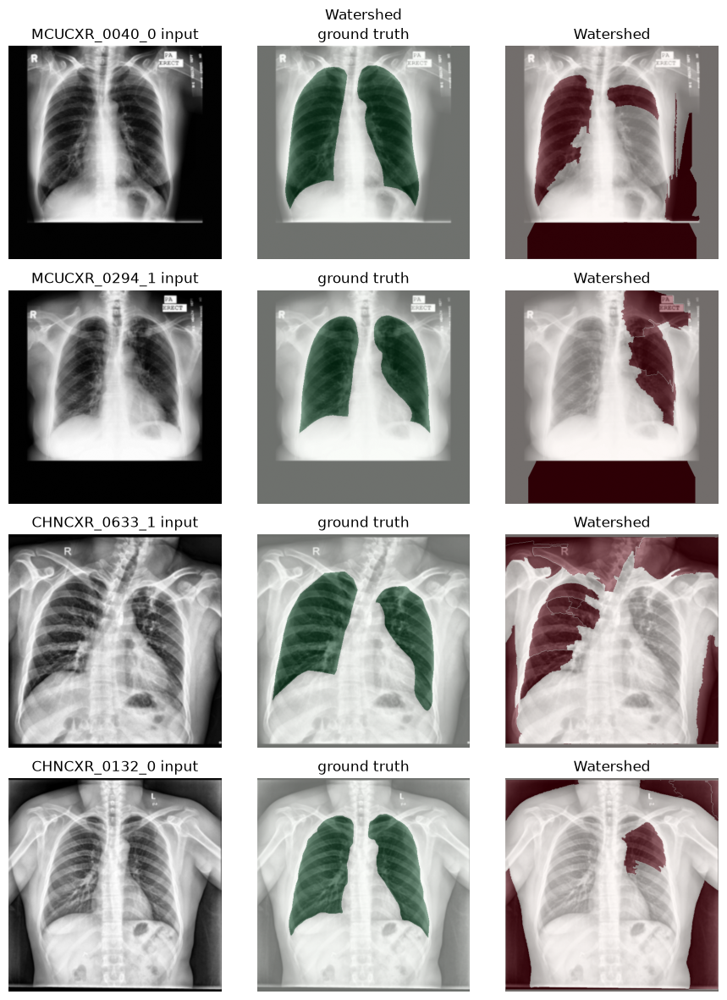

In [9]:
def segment_watershed(img, valid_mask):
    smooth = cv2.GaussianBlur(img, (5, 5), 0)
    _, binary = cv2.threshold(smooth, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    binary = ((binary > 0) & valid_mask).astype(np.uint8) * 255

    dist = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist, 0.4 * dist.max(), 255, 0)
    sure_fg = sure_fg.astype(np.uint8)
    sure_bg = cv2.dilate(binary, np.ones((15, 15), np.uint8), iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown > 0] = 0

    img_bgr = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(img_bgr, markers)
    pred = (markers > 1) & valid_mask  # exclude background label (1) and boundary label (-1)
    return pred

show_method_grid(segment_watershed, "Watershed")

## 4.7 Graph-based — Felzenszwalb–Huttenlocher

Builds a graph with pixels as nodes and edge weights equal to intensity difference between
neighbors, then greedily merges regions bottom-up. Two components $C_1, C_2$ are merged if the
minimum edge weight between them, $w(C_1, C_2)$, is not much larger than either component's own
internal variation:

$$w(C_1, C_2) \le \min\big(\text{Int}(C_1) + \tfrac{k}{|C_1|},\ \text{Int}(C_2) + \tfrac{k}{|C_2|}\big)$$

where $\text{Int}(C)$ is the largest edge weight in $C$'s minimum spanning tree and $k$ (`scale`
below) trades off region count vs. size — larger $k$ favors larger merged regions. The output is an
oversegmentation into superpixels with no notion of "foreground"; we call the darkest quartile of
segments (by mean intensity, restricted to the valid region) the predicted lung region.

**Why scale=200, sigma=0.8, min_size=300, and the darkest-quartile cutoff:** these sit close to the
values skimage's own documentation and example gallery use at comparable image sizes; scale=200 was
checked by eye on the demo images to give segments at roughly the scale of real anatomical
structures (ribs, lung lobes) rather than hundreds of tiny fragments or two or three huge blobs. The
darkest-quartile cutoff (25% of segments) is a round-number choice reflecting that lungs occupy a
meaningful but clear minority of the image area — neither number was tuned against ground truth.

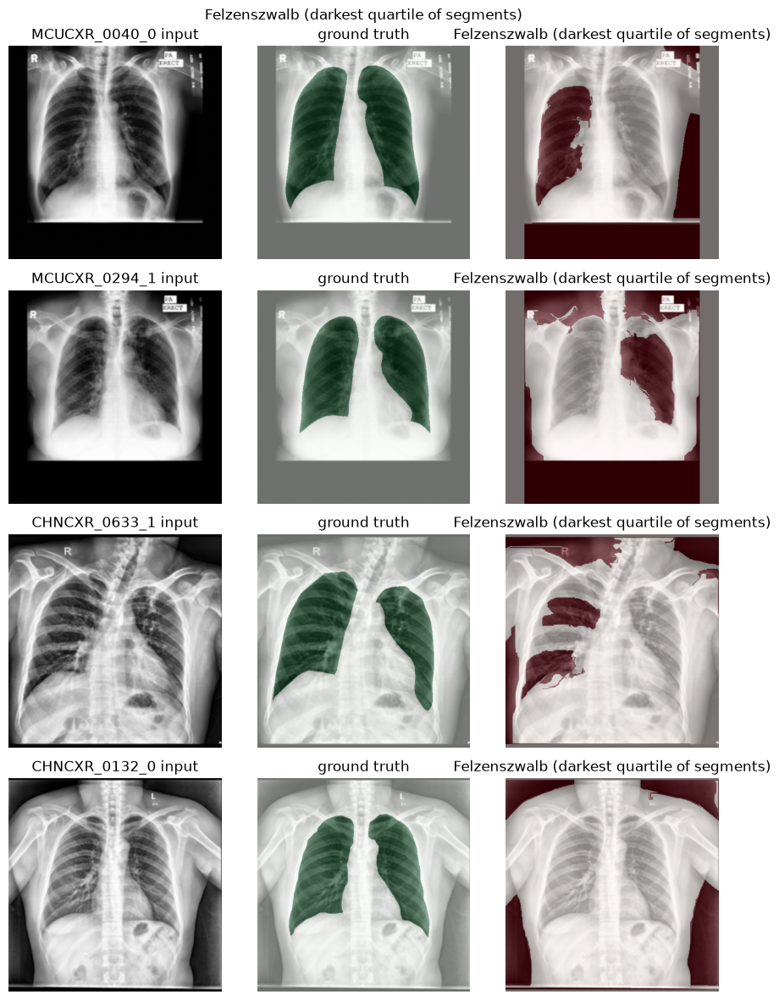

In [10]:
def segment_felzenszwalb(img, valid_mask, scale=200, sigma=0.8, min_size=300):
    segments = felzenszwalb(img.astype(np.float64) / 255.0, scale=scale, sigma=sigma, min_size=min_size)
    seg_ids = np.unique(segments[valid_mask])
    means = sorted(((sid, img[(segments == sid) & valid_mask].mean()) for sid in seg_ids), key=lambda t: t[1])
    n_fg = max(1, len(means) // 4)
    fg_ids = {sid for sid, _ in means[:n_fg]}
    return np.isin(segments, list(fg_ids)) & valid_mask

show_method_grid(segment_felzenszwalb, "Felzenszwalb (darkest quartile of segments)")

## 4.8 Template matching — normalized cross-correlation (baseline / sanity check)

**Not a serious contender** — included as a baseline because it's the simplest possible classical
approach and makes a good sanity check for "did the pipeline wire up correctly," not because it's
expected to generalize. We pick one fixed training exemplar (image + its ground-truth mask) as a
template, and for every other image find the translation $(u,v)$ that maximizes normalized
cross-correlation with that template:

$$\gamma(u,v) = \frac{\sum_{x,y}[I(x{+}u, y{+}v) - \bar{I}_{u,v}][T(x,y) - \bar{T}]}
{\sqrt{\sum_{x,y}[I(x{+}u,y{+}v)-\bar{I}_{u,v}]^2 \sum_{x,y}[T(x,y)-\bar{T}]^2}}$$

then transplant the *template's* mask to the best-matching location in the target image. This only
works when the target's anatomy is roughly the same size/position/shape as the template's — false
for two different patients, different sources, different framing — which is exactly why it's a
baseline, not a real method.

**Why 2/3 scale for the template:** `cv2.matchTemplate` requires the template to be strictly
smaller than the search image; 2/3 is the mildest shrink that satisfies that constraint, keeping as
much of the template's detail as possible while still leaving a meaningful range of translational
positions to search over.

Template exemplar: MCUCXR_0001_0


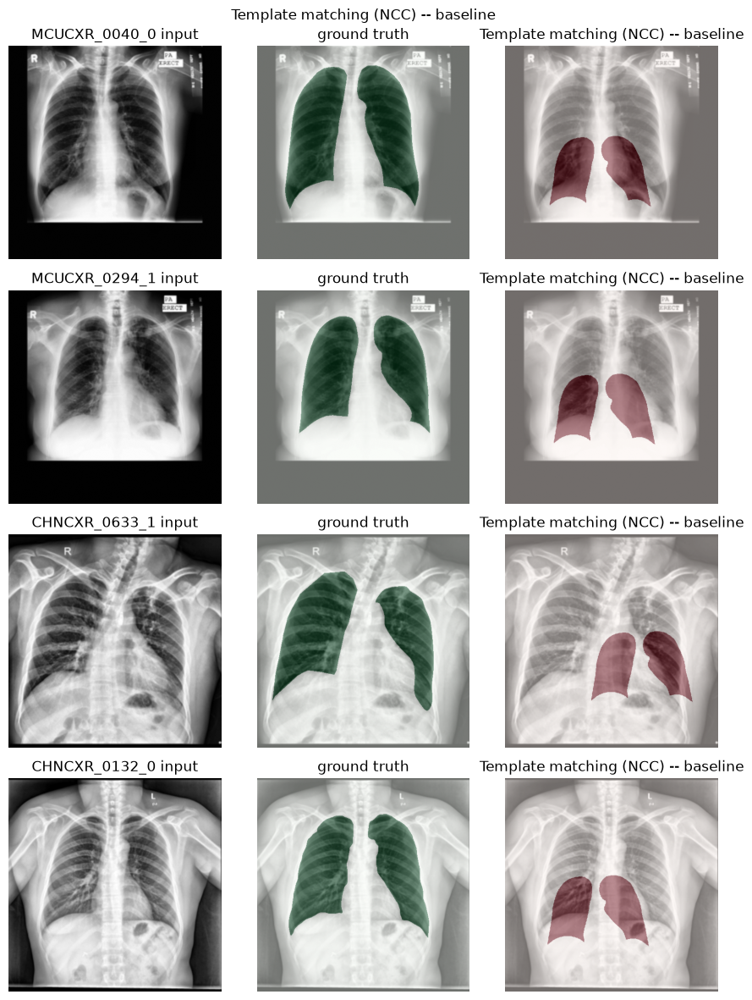

In [11]:
template_id = sorted(train_df.loc[train_df.source == "Montgomery", "id"])[0]
template_img, template_mask = load_processed(template_id)
th, tw = int(template_img.shape[0] * 2 / 3), int(template_img.shape[1] * 2 / 3)
template_small = cv2.resize(template_img, (tw, th))
template_mask_small = cv2.resize(template_mask, (tw, th), interpolation=cv2.INTER_NEAREST)
print("Template exemplar:", template_id)

def segment_template_match(img, valid_mask):
    res = cv2.matchTemplate(img, template_small, cv2.TM_CCOEFF_NORMED)
    _, _, _, (x, y) = cv2.minMaxLoc(res)
    pred = np.zeros_like(img, dtype=bool)
    pred[y:y + th, x:x + tw] = template_mask_small > 127
    return pred & valid_mask

show_method_grid(segment_template_match, "Template matching (NCC) -- baseline")

## 4.9 Consolidated comparison

All eight techniques on the same demo images, side by side.

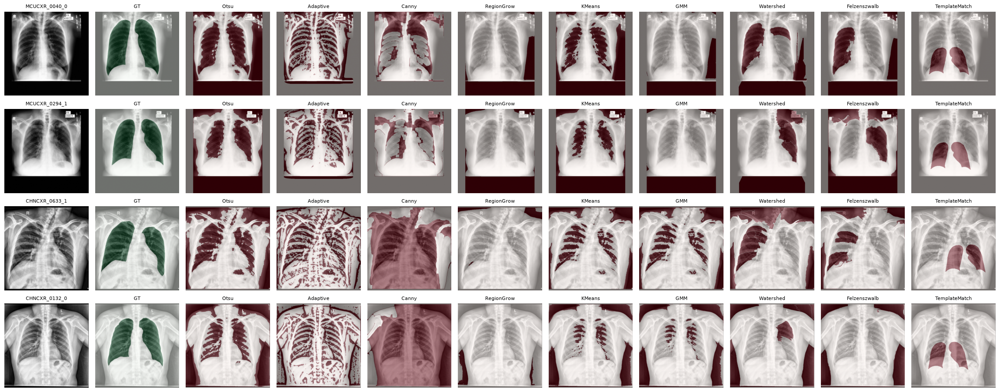

In [12]:
METHODS = [
    ("Otsu", segment_otsu),
    ("Adaptive", segment_adaptive),
    ("Canny", segment_canny),
    ("RegionGrow", segment_region_growing),
    ("KMeans", segment_kmeans),
    ("GMM", segment_gmm),
    ("Watershed", segment_watershed),
    ("Felzenszwalb", segment_felzenszwalb),
    ("TemplateMatch", segment_template_match),
]

n_cols = 2 + len(METHODS)
fig, axes = plt.subplots(len(DEMO_IDS), n_cols, figsize=(2.1 * n_cols, 2.3 * len(DEMO_IDS)))
for row, id_ in zip(axes, DEMO_IDS):
    img, gt = load_processed(id_)
    vmask = valid_region_mask(id_)
    row[0].imshow(img, cmap="gray"); row[0].set_title(id_, fontsize=8); row[0].axis("off")
    row[1].imshow(img, cmap="gray"); row[1].imshow(gt, cmap="Greens", alpha=0.45); row[1].set_title("GT", fontsize=8); row[1].axis("off")
    for ax, (name, fn) in zip(row[2:], METHODS):
        pred = fn(img, vmask)
        ax.imshow(img, cmap="gray"); ax.imshow(pred.astype(np.uint8) * 255, cmap="Reds", alpha=0.45)
        ax.set_title(name, fontsize=8); ax.axis("off")
fig.tight_layout()
plt.show()

## Step 6 (segmentation) — Benchmarking

Every method from Step 4 is now run over the full **test split (106 images)** — held out from
everything in Step 4, so this is a genuine out-of-sample comparison, not a re-check on the demo
images we tuned parameters against.

Metrics, for binary masks $P$ (prediction) and $G$ (ground truth):

$$\text{Dice} = \frac{2|P \cap G|}{|P| + |G|}, \qquad
\text{IoU} = \frac{|P \cap G|}{|P \cup G|}, \qquad
\text{PixelAcc} = \frac{|P = G|}{\text{total pixels}}$$

Hausdorff distance (the largest of the "closest point" distances in either direction — sensitive
to a single bad outlier region in a way Dice/IoU aren't) is computed on a **random 20-image
subsample** rather than all 106: it involves nearest-neighbor search between two point sets that
can have tens of thousands of foreground pixels each, and the assignment explicitly allows
skipping/limiting it, "if time allows".

In [13]:
from tqdm.auto import tqdm
from skimage.metrics import hausdorff_distance

def dice_score(pred, gt):
    pred = pred.astype(bool); gt = gt.astype(bool)
    denom = pred.sum() + gt.sum()
    return 1.0 if denom == 0 else 2 * np.logical_and(pred, gt).sum() / denom

def iou_score(pred, gt):
    pred = pred.astype(bool); gt = gt.astype(bool)
    union = np.logical_or(pred, gt).sum()
    return 1.0 if union == 0 else np.logical_and(pred, gt).sum() / union

def pixel_accuracy(pred, gt):
    return (pred.astype(bool) == gt.astype(bool)).mean()

test_df = manifest[manifest.split == "test"]
print(f"Benchmarking {len(METHODS)} methods on {len(test_df)} test-split images "
      f"({len(METHODS) * len(test_df)} method-image evaluations)")

Benchmarking 9 methods on 106 test-split images (954 method-image evaluations)


In [14]:
rows = []
for r in tqdm(list(test_df.itertuples()), desc="segmentation benchmarking"):
    img, gt_raw = load_processed(r.id)
    gt = gt_raw > 127
    vmask = valid_region_mask(r.id)
    for name, fn in METHODS:
        pred = fn(img, vmask)
        rows.append({"id": r.id, "source": r.source, "method": name,
                      "dice": dice_score(pred, gt), "iou": iou_score(pred, gt),
                      "pixel_acc": pixel_accuracy(pred, gt)})

seg_results = pd.DataFrame(rows)
seg_results.to_csv(DATA_DIR / "segmentation_benchmark.csv", index=False)
print(f"Done: {len(seg_results)} rows")

segmentation benchmarking:   0%|          | 0/106 [00:00<?, ?it/s]

Done: 954 rows


In [15]:
HAUSDORFF_SAMPLE_N = 20
hd_ids = test_df["id"].sample(HAUSDORFF_SAMPLE_N, random_state=0).tolist()

hd_rows = []
for id_ in tqdm(hd_ids, desc="Hausdorff (20-image subsample)"):
    img, gt_raw = load_processed(id_)
    gt = gt_raw > 127
    vmask = valid_region_mask(id_)
    for name, fn in METHODS:
        pred = fn(img, vmask)
        hd = hausdorff_distance(pred, gt) if pred.any() and gt.any() else np.nan
        hd_rows.append({"id": id_, "method": name, "hausdorff": hd})

hd_df = pd.DataFrame(hd_rows)
print("NaN hausdorff rows (method predicted an empty mask):", hd_df["hausdorff"].isna().sum())

Hausdorff (20-image subsample):   0%|          | 0/20 [00:00<?, ?it/s]

NaN hausdorff rows (method predicted an empty mask): 0


### Results table and bar chart

,dice,iou,pixel_acc,hausdorff_px (n=20 subsample)
method,,,,
Canny,0.617,0.461,0.702,183.5
Otsu,0.506,0.345,0.717,188.9
Adaptive,0.452,0.293,0.710,184.7
KMeans,0.360,0.228,0.701,188.1
Watershed,0.304,0.209,0.691,209.9
GMM,0.295,0.189,0.699,190.8
TemplateMatch,0.272,0.163,0.765,200.0
Felzenszwalb,0.145,0.097,0.682,198.3
RegionGrow,0.009,0.004,0.725,284.3


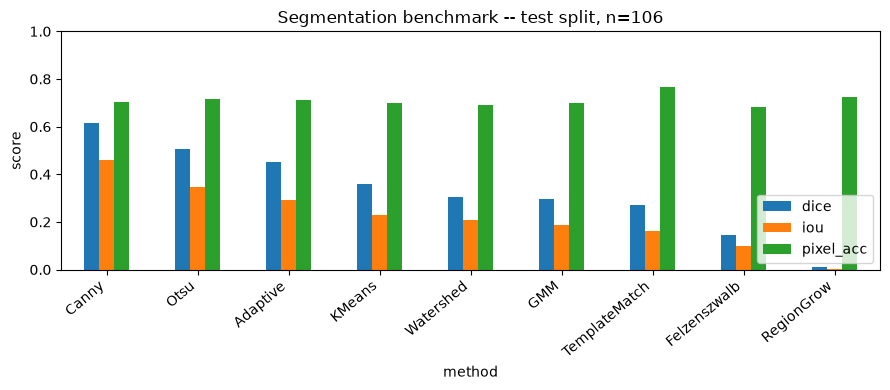

In [16]:
summary = seg_results.groupby("method")[["dice", "iou", "pixel_acc"]].mean().round(3)
summary["hausdorff_px (n=20 subsample)"] = hd_df.groupby("method")["hausdorff"].mean().round(1)
summary = summary.sort_values("dice", ascending=False)
display(summary)

fig, ax = plt.subplots(figsize=(9, 4))
summary[["dice", "iou", "pixel_acc"]].plot.bar(ax=ax)
ax.set_ylabel("score"); ax.set_ylim(0, 1)
ax.set_title(f"Segmentation benchmark -- test split, n={len(test_df)}")
ax.legend(loc="lower right")
plt.xticks(rotation=40, ha="right")
fig.tight_layout(); plt.show()

### Qualitative comparison: one representative test image, every method

Each panel is annotated with that method's Dice score on this specific image.

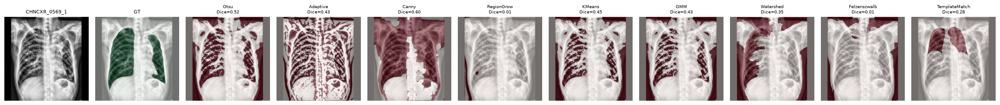

In [17]:
rep_id = test_df["id"].sample(1, random_state=3).iloc[0]
img, gt_raw = load_processed(rep_id)
gt = gt_raw > 127
vmask = valid_region_mask(rep_id)

fig, axes = plt.subplots(1, 2 + len(METHODS), figsize=(2.1 * (2 + len(METHODS)), 2.6))
axes[0].imshow(img, cmap="gray"); axes[0].set_title(rep_id, fontsize=8); axes[0].axis("off")
axes[1].imshow(img, cmap="gray"); axes[1].imshow(gt, cmap="Greens", alpha=0.45); axes[1].set_title("GT", fontsize=8); axes[1].axis("off")
for ax, (name, fn) in zip(axes[2:], METHODS):
    pred = fn(img, vmask)
    d = dice_score(pred, gt)
    ax.imshow(img, cmap="gray"); ax.imshow(pred.astype(np.uint8) * 255, cmap="Reds", alpha=0.45)
    ax.set_title(f"{name}\nDice={d:.2f}", fontsize=7); ax.axis("off")
fig.tight_layout(); plt.show()

### Failure cases — each method's worst test-split image

Required by the assignment: at least one failure case per method. These are each method's own
single lowest-Dice image in the test split, so they're genuinely the cases that method struggles
with most, not a shared "hard image" picked to make everything look bad.

,method,id,source,dice,iou,pixel_acc
203,GMM,CHNCXR_0179_0,Shenzhen,0.000000,0.000000,0.774696
7,Felzenszwalb,CHNCXR_0002_0,Shenzhen,0.000000,0.000000,0.648201
3,RegionGrow,CHNCXR_0002_0,Shenzhen,0.000000,0.000000,0.739017
15,Watershed,CHNCXR_0005_0,Shenzhen,0.000000,0.000000,0.588898
35,TemplateMatch,CHNCXR_0029_0,Shenzhen,0.064808,0.033489,0.772106
193,KMeans,CHNCXR_0178_0,Shenzhen,0.067355,0.034851,0.672085
189,Otsu,CHNCXR_0178_0,Shenzhen,0.107902,0.057028,0.669350
893,Canny,MCUCXR_0311_1,Montgomery,0.207306,0.115639,0.805882
829,Adaptive,MCUCXR_0080_0,Montgomery,0.297407,0.174679,0.746029


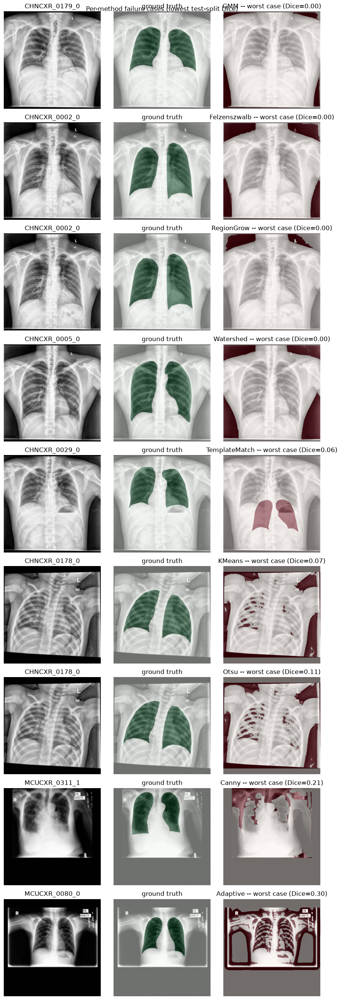

In [18]:
worst_per_method = seg_results.loc[seg_results.groupby("method")["dice"].idxmin()].sort_values("dice")
display(worst_per_method[["method", "id", "source", "dice", "iou", "pixel_acc"]])

method_lookup = dict(METHODS)
fig, axes = plt.subplots(len(worst_per_method), 3, figsize=(9, 3 * len(worst_per_method)))
for row, (_, rec) in zip(axes, worst_per_method.iterrows()):
    img, gt_raw = load_processed(rec.id)
    gt = gt_raw > 127
    vmask = valid_region_mask(rec.id)
    pred = method_lookup[rec.method](img, vmask)
    row[0].imshow(img, cmap="gray"); row[0].set_title(rec.id); row[0].axis("off")
    row[1].imshow(img, cmap="gray"); row[1].imshow(gt, cmap="Greens", alpha=0.45); row[1].set_title("ground truth"); row[1].axis("off")
    row[2].imshow(img, cmap="gray"); row[2].imshow(pred.astype(np.uint8) * 255, cmap="Reds", alpha=0.45)
    row[2].set_title(f"{rec.method} -- worst case (Dice={rec.dice:.2f})"); row[2].axis("off")
fig.suptitle("Per-method failure cases (lowest test-split Dice)")
fig.tight_layout(); plt.show()